# Style Transfer Project

This project was a part of my home assignmnet for the computer vision course. In this project I explored and implemented a technique for image style transfer known as Neural Style Transfer.

Neural Style Transfer is a technique that merges two images, namely, a "content" image and a "style" image, to create a new, "stylized" image. The new image retains the "content" from the content image and the "style" from the style image. The process includes feature extraction from two images using a pre-trained neural network and further modification of the target image by minimizing the difference between features of the content and style images.

Neural Style Transfer method is not computationally efficient, therefore, in the second part of the work I investigated impact of hyperparameter values on execution time and quality of the output image. In addition, I experimented with postprocessing methods. Finally, I achieved comparable output quality with a model that stylizes an image in 5 seconds, compared to another model that takes 49 seconds to stylize the same image.

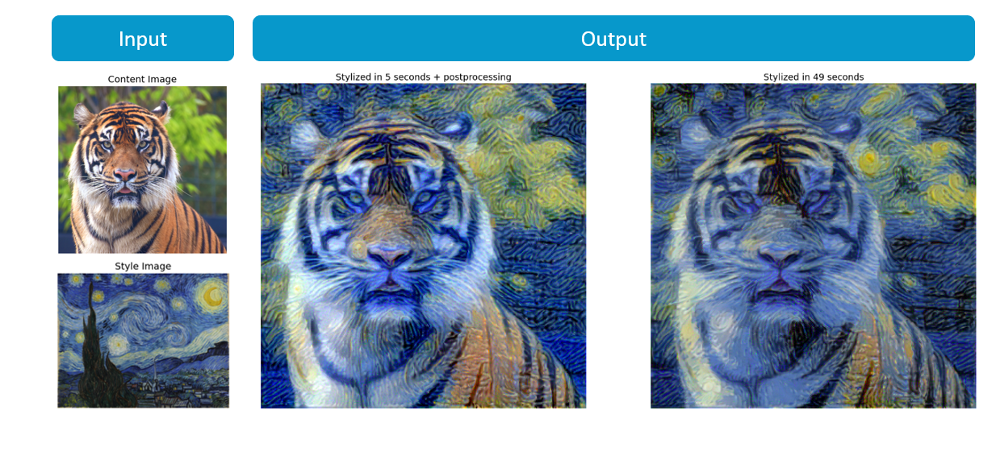

In [34]:
#importing modules and libraries
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from torchvision import transforms, models
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import display, clear_output
from time import time
import warnings
import numpy as np
from PIL import Image

warnings.simplefilter('ignore')

## Neural Style Transfer

The method include the following steps:

1. Initialization: the target image is represented by the content image.
2. Feature Extraction: a pre-trained convolutional neural network (like VGG) is used to extract features from the content, style, and initial images.
3. Optimization: at this step we modify the initial image to minimize the difference between its features and the features of the content and style images. This is normally done using gradient descent.

In [2]:
#functions used further to implement Neural Style Transfer method

#Loads and transforms an image
def load_image(image_path, transform=None, max_size=None):
    image = Image.open(image_path).convert('RGB')
    
    if max_size:
        scale = max_size / max(image.size)
        size = np.array(image.size) * scale
        image = image.resize(size.astype(int), Image.ANTIALIAS)
    
    if transform:
        image = transform(image).unsqueeze(0)
    
    return image

#Converts normalized image to the initial format
def im_convert(tensor):
    image = tensor.to("cpu").clone().detach()
    image = image.numpy().squeeze()
    image = image.transpose(1,2,0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)
    return image

# a new  module, with hooks to capture style and content features
def get_features(x, model, layers=None):
    features = {}
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[name] = x
    return features

# calculate content loss
def content_loss(target_feature, content_feature):
    return torch.mean((target_feature - content_feature)**2)

# calculate the gram matrix
def gram_matrix(tensor):
    _, d, h, w = tensor.size()
    tensor = tensor.view(d, h * w)
    gram = torch.mm(tensor, tensor.t())
    return gram

# style loss
def style_loss(target_feature, style_gram):
    _, d, h, w = target_feature.shape
    target_gram = gram_matrix(target_feature)
    return torch.mean((target_gram - style_gram)**2) / (d * h * w)

transform = transforms.Compose([
    transforms.Resize(400),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])


In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
# getting pretrained vgg16 model and freezing all parameters are we are interested in the target image
vgg = models.vgg16(pretrained=True).features

for param in vgg.parameters():
    param.requires_grad_(False)
    
vgg.to(device)

C:\Users\sofya\AppData\Roaming\Python\Python39\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\sofya\AppData\Roaming\Python\Python39\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [35]:
# Load content and style image
content = load_image('tiger.png', transform, max_size=400).to(device)
style = load_image('style.jpg', transform, max_size=400).to(device)

Let us take a look at the content and style images I am using to demonstrate work of Neural Style Transfer.

(-0.5, 505.5, 399.5, -0.5)

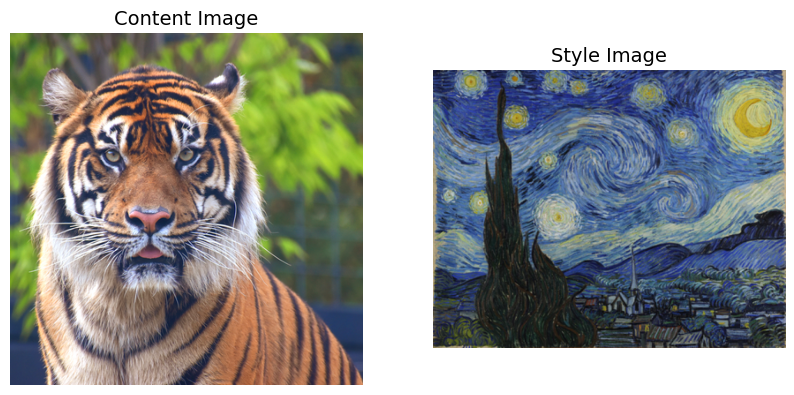

In [125]:
fig, axs = plt.subplots(1, 2, figsize=(10, 20))
final_img = im_convert(content)
axs[0].imshow(final_img)
axs[0].set_title('Content Image', fontsize= 14)
axs[0].axis('off')
style_img = im_convert(style)
axs[1].imshow(style_img)
axs[1].set_title('Style Image', fontsize= 14)
axs[1].axis('off')

Text(0.5, 1.0, 'Style Image')

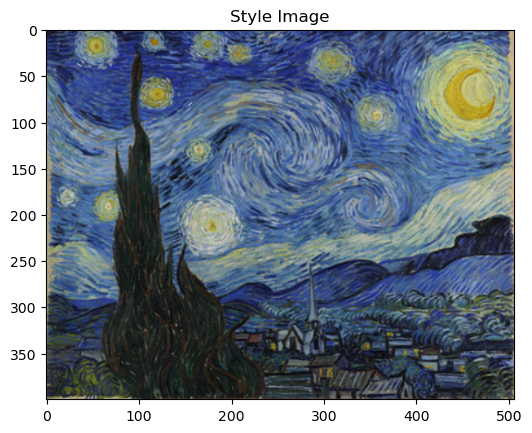

In [208]:
style_img = im_convert(style)
plt.imshow(style_img)
plt.title('Style Image')

In [88]:
#layers to take into account
content_layers = ['21']
style_layers = ['0' ,'5', '10', '19', '28']

# weights for each style layer 
style_weights =   {'0': 2.0, '5': 1.5, '10': 1.0, '19': 0.3, '28': 0.1}

# Loss and weights
content_weight = 0.3
style_weight = 1e20


#indicating hyperparameters
hyperparams = {
   'lr':0.05,
   'n_iter': 1000
}

#capturing features and calculating gram matrices
content_features = get_features(content, vgg, layers=content_layers)
style_features = get_features(style, vgg, layers=style_layers)
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}



In [ ]:
def stylize_image(content, style, content_layers, style_layers, style_weights, vgg, hyperparams, device):
    
    '''
    Returns a stylyzed image.
    
    Parameters:
    
    content - content image, pytorch tensor
    style - stylr image, pytorch tensor
    content_layers - layers to be used to extract content features
    style_layers - layers to be used to extract style features
    style_weights - weights of style layers
    vgg - the pre-trained model
    hyperparams - dictionary with hyperparameters
    device - device (cuda or cpu)
    '''
    start_time = time()
    target_image = content.clone().requires_grad_(True).to(device)
    optimizer = optim.Adam([target_image], lr=hyperparams['lr'])  
    content_features = get_features(content.to(device), vgg, layers=content_layers)
    style_features = get_features(style.to(device), vgg, layers=style_layers)
    style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}
    
    for i in range(1, hyperparams['n_iter']):
        target_features = get_features(target_image, vgg, layers=content_layers+style_layers)
        c_loss = content_loss(target_features[content_layers[0]], content_features[content_layers[0]])

        s_loss = 0
        for layer in style_layers:
            s_loss += style_weights[layer] * style_loss(target_features[layer], style_grams[layer])

        total_loss = content_weight * c_loss + style_weight * s_loss

        optimizer.zero_grad()
        total_loss.backward(retain_graph=True)
        optimizer.step()

    final_img = im_convert(target_image)
    end_time = time()
    print(f'execution time: {int(end_time - start_time)} sec')
    return final_img

execution time: 49 sec


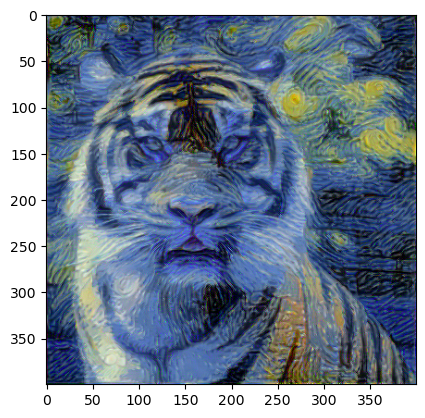

In [89]:
final_img_0 = stylize_image(content, style, content_layers, style_layers, style_weights, vgg, hyperparams, device = 'cuda')
plt.imshow(final_img_0)

## Model Finetuning

The starting time of algorithm's work is quite high - 37 seconds to process one image. Further I experiments with learning rate and number of iterations in order to find the balance between timing and image quality.

In [40]:
images_lr = []

for lr in [0.01, 0.05, 0.09, 0.13]:
    hyperparams = {
   'lr':lr,
   'n_iter': 400
                   }
    print('lr =', lr)
    final_img = stylize_image(content, style, content_layers, style_layers, style_weights, vgg, hyperparams, device = 'cuda')
    images_lr.append((final_img, lr))
    
    
    
images_iter = []

for n_iter in [100, 200, 300, 400]:
    hyperparams = {
   'lr':0.01,
   'n_iter': n_iter
                   }
    print('number of iterations =', n_iter)
    final_img = stylize_image(content, style, content_layers, style_layers, style_weights, vgg, hyperparams, device = 'cuda')
    images_iter.append((final_img, n_iter))


lr = 0.01
execution time: 15 sec
lr = 0.05
execution time: 15 sec
lr = 0.09
execution time: 56 sec
lr = 0.13
execution time: 68 sec
number of iterations = 100
execution time: 17 sec
number of iterations = 200
execution time: 34 sec
number of iterations = 300
execution time: 51 sec
number of iterations = 400
execution time: 68 sec


The result of the experiment is demonstrated below. First, increase in number of iterations has a greater impact on timing than learning rate. In addition, greater number of iterations actually inclease the degree of realism of the initial image. Our goal is, however, to stylize an image so that a user is able, for example, identify the style or the author whose artwork was used to stylize an image. Higher learning rate also causes processing time to increase, but to a lesser extent.

different lr, n_iter = 400


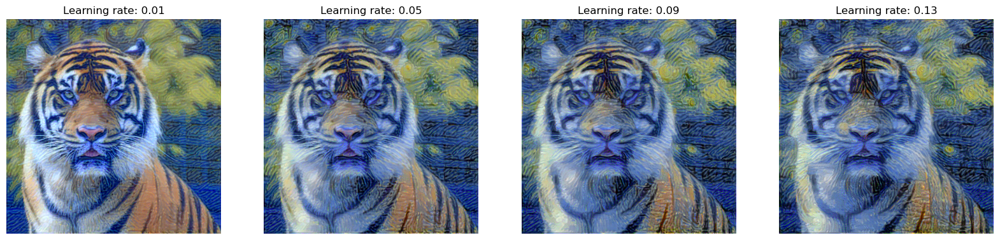

different n_iter, lr = 0.01


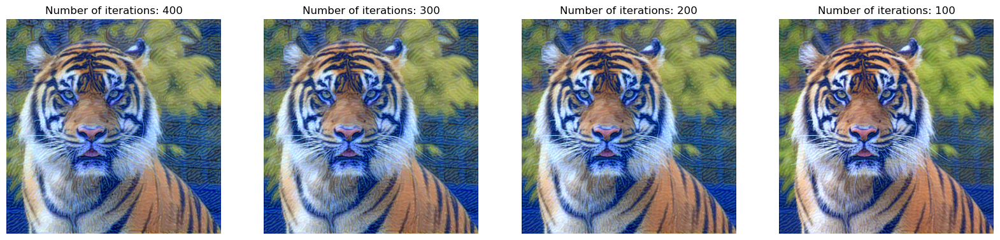

In [54]:
fig, axs = plt.subplots(1, 4, figsize=(20, 5))
for ax, t in zip(axs, images_lr):
    im, lr = t[0], t[1]
    ax.imshow(im)
    ax.set_title(f"Learning rate: {lr}")
    ax.axis('off')

print('different lr, n_iter = 400')
plt.show()

fig, axs = plt.subplots(1, 4, figsize=(20, 5))
for ax, t in zip(axs, images_iter[::-1]):
    im, lr = t[0], t[1]
    ax.imshow(im)
    ax.set_title(f"Number of iterations: {lr}")
    ax.axis('off')
    
print('different n_iter, lr = 0.01')
plt.show()

The right strategy would be to decrease number of iterations and increase the learning rate until we reach approproicate balance. For example, with learning rate set to 0.15 and number of iterations equal to 150, we achieved processing speed of 5 seconds.

execution time: 5 sec


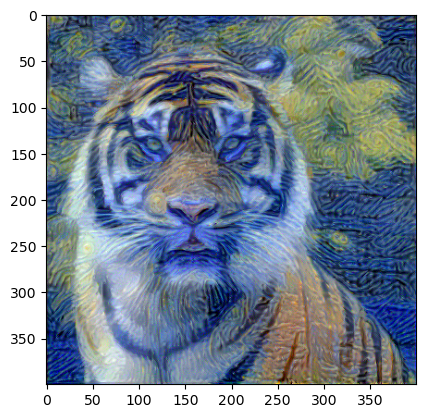

In [58]:
#indicating hyperparameters
hyperparams = {
   'lr':0.15,
   'n_iter': 150
}

final_img = stylize_image(content, style, content_layers, style_layers, style_weights, vgg, hyperparams, device = 'cuda')
plt.imshow(final_img)

The resulting image is not as vibrant as the initial one that was stylized for 37 seconds. A good way out is using postprocessing. For example, let us increase contrast of the image that was stylized in 5 seconds and compare the final result with the first image.

(-0.5, 399.5, 399.5, -0.5)

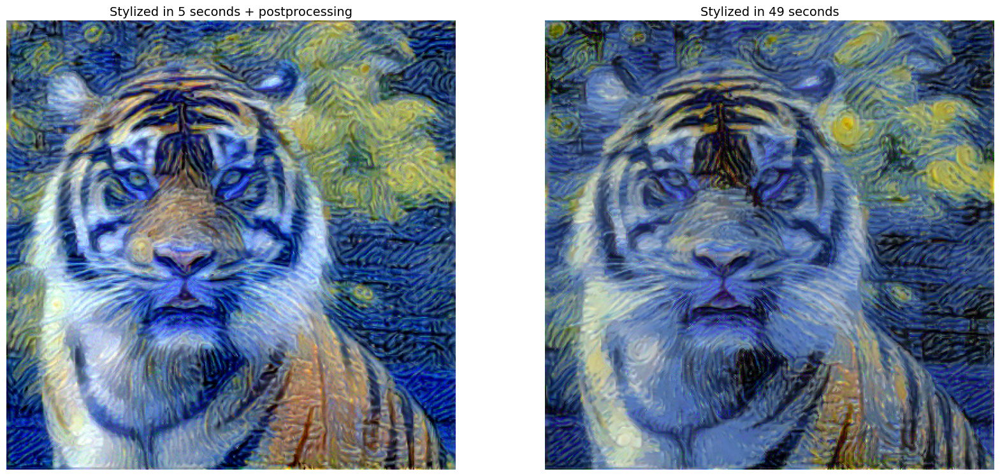

In [108]:
#increasing contrast of the image
pil_image = Image.fromarray(np.uint8(final_img*255))
contrast = 1.2
enhancer = ImageEnhance.Contrast(pil_image)
contrast_enhanced_image = enhancer.enhance(contrast)

fig, axs = plt.subplots(1, 2, figsize=(20, 20))
axs[0].imshow(contrast_enhanced_image)
axs[0].set_title('Stylized in 5 seconds + postprocessing', fontsize= 14)
axs[1].imshow(final_img_0)
axs[1].set_title('Stylized in 49 seconds', fontsize= 14)
axs[0].axis('off')
axs[1].axis('off')

In [126]:
#correcting the final function
def stylize_image(content, style, content_layers, style_layers, style_weights, vgg, hyperparams, device, contrast = 1.2):
    
    '''
    Returns a stylyzed image.
    
    Parameters:
    
    content - content image, pytorch tensor
    style - stylr image, pytorch tensor
    content_layers - layers to be used to extract content features
    style_layers - layers to be used to extract style features
    style_weights - weights of style layers
    vgg - the pre-trained model
    hyperparams - dictionary with hyperparameters
    device - device (cuda or cpu)
    '''
    start_time = time()
    target_image = content.clone().requires_grad_(True).to(device)
    optimizer = optim.Adam([target_image], lr=hyperparams['lr'])  
    content_features = get_features(content.to(device), vgg, layers=content_layers)
    style_features = get_features(style.to(device), vgg, layers=style_layers)
    style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}
    
    for i in range(1, hyperparams['n_iter']):
        target_features = get_features(target_image, vgg, layers=content_layers+style_layers)
        c_loss = content_loss(target_features[content_layers[0]], content_features[content_layers[0]])

        s_loss = 0
        for layer in style_layers:
            s_loss += style_weights[layer] * style_loss(target_features[layer], style_grams[layer])

        total_loss = content_weight * c_loss + style_weight * s_loss

        optimizer.zero_grad()
        total_loss.backward(retain_graph=True)
        optimizer.step()

    final_img = im_convert(target_image)
    pil_image = Image.fromarray(np.uint8(final_img*255))
    contrast = contrast
    enhancer = ImageEnhance.Contrast(pil_image)
    contrast_enhanced_image = enhancer.enhance(contrast)
    end_time = time()
    print(f'execution time: {int(end_time - start_time)} sec')
    return final_img

execution time: 5 sec


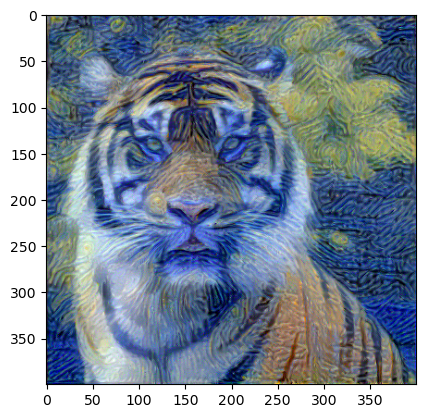

In [111]:
hyperparams = {
   'lr':0.15,
   'n_iter': 150
}
final_img_enhanced = stylize_image(content, style, content_layers, style_layers, style_weights, vgg, hyperparams, device = 'cuda', contrast = 1.2)
plt.imshow(final_img_enhanced)

In [ ]:
# Load content and style image
content = load_image('tiger.png', transform, max_size=400).to(device)
style = load_image('style.jpg', transform, max_size=400).to(device)